In [1]:
using DifferentialEquations
using Plots
gr(fmt = :png)

┌ Info: Recompiling stale cache file C:\Users\Vojta\.julia\compiled\v0.7\DifferentialEquations\UQdwS.ji for DifferentialEquations [0c46a032-eb83-5123-abaf-570d42b7fbaa]
└ @ Base loading.jl:1185


Plots.GRBackend()

In [364]:
const c = 3.0*10.0^10
const G = 6.67*10.0^-8
const K = 1.98*10.0^-6
const gamma = 11/4

2.75

In [401]:
function diff_eq(du, u, p, r)
    if u[2] >= 0.0
        du[1] = 4*pi*r^2*((u[2]/K)^(1/gamma)+u[2]/c^2)
        du[2] = -G*((u[2]/K).^(1/gamma) + u[2]/c^2)*(u[1] + 4*pi*r^3*u[2]/c^2)/(r*(r-2*u[1]*G/c^2))
    else
        du[1] = 0
        du[2] = 0
    end
    return du
end

diff_eq (generic function with 2 methods)

In [488]:
N = 1000
sol_fin = Array{Any,1}(undef,0)
rho = zeros(N)
P = zeros(N)
for j = 1:N
    rho_c = 10.0^(j/400)*10.0^14
    rho[j] = rho_c
    P_c = K*rho_c^gamma
    P[j] = P_c
    u0 = [0.0, P_c]
    p = 0.0
    rspan = (1.0,1500000.0)
    prob = ODEProblem(diff_eq,u0,rspan, p)
    sol = solve(prob, force_dtmin=true)
    push!(sol_fin, sol)
end

In [489]:
P

1000-element Array{Float64,1}:
 6.3612166976514245e32
 6.4627177666383645e32
 6.56583841054236e32  
 6.670604471681516e32 
 6.777042204720029e32 
 6.885178283247687e32 
 6.995039806464356e32 
 7.106654305971107e32 
 7.220049752669692e32 
 7.33525456377217e32  
 7.452297609922304e32 
 7.57120822243063e32  
 7.692016200624982e32 
 ⋮                    
 3.9449380743365314e39
 4.007884433604605e39 
 4.071835179778238e39 
 4.1368063390909996e39
 4.202814193494811e39 
 4.2698752847402476e39
 4.3380064185219423e39
 4.407224668690155e39 
 4.477547381529479e39 
 4.548992180105938e39 
 4.6215769686833255e39
 4.6953199372100777e39

In [490]:
rho

1000-element Array{Float64,1}:
 1.0057730630017383e14
 1.0115794542598986e14
 1.0174193661806048e14
 1.023292992280754e14 
 1.0292005271944283e14
 1.0351421666793439e14
 1.0411181076233395e14
 1.0471285480508997e14
 1.0531736871297161e14
 1.0592537251772889e14
 1.0653688636675633e14
 1.0715193052376064e14
 1.0777052536943219e14
 ⋮                    
 2.9682467434632428e16
 2.9853826189179604e16
 3.002617420861268e16 
 3.0199517204020164e16
 3.0373860919461044e16
 3.0549211132155124e16
 3.0725573652674456e16
 3.090295432513592e16 
 3.1081359027394764e16
 3.126079367123956e16 
 3.1441264202587964e16
 3.162277660168379e16 

In [482]:
mass_r = Array{Any,1}(undef,0)
for j = 1:N
    for k = 1:size(sol_fin[j], 2)
        if sol_fin[j][k+1][2] <= 0.0
            push!(mass_r, [sol_fin[j].t[k], sol_fin[j][k][1]])
            break
        end
    end
end

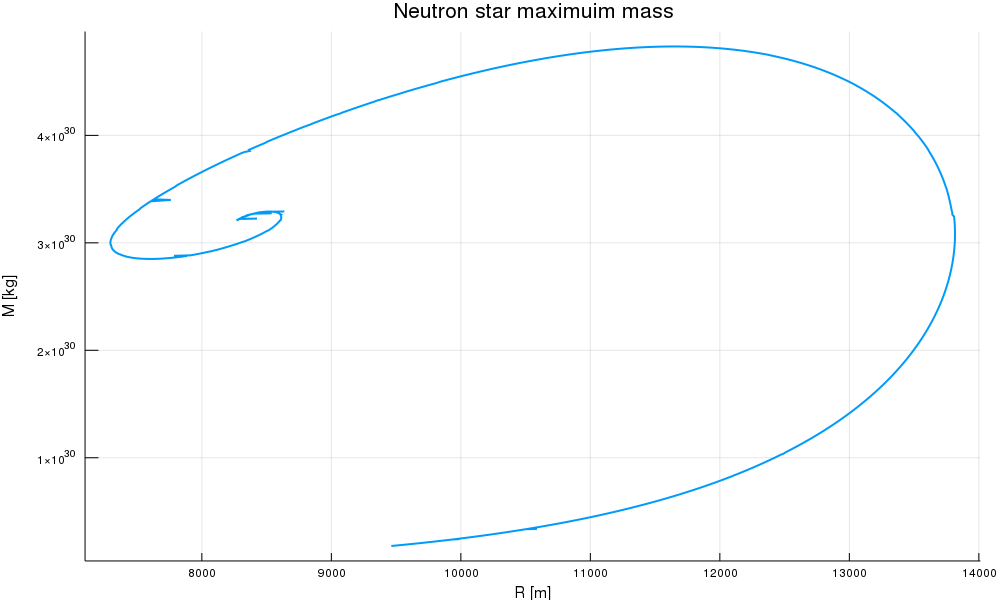

In [492]:
Plots.plot([mass_r[i][1]/100 for i = 1:size(mass_r,1)], [mass_r[i][2]/1000 for i = 1:size(mass_r,1)], legend = :none, linewidth = 2, xlabel = "R [m]", ylabel = "M [kg]", size = (1000, 600), title = "Neutron star maximuim mass")